In [2]:
from rdkit.Chem.Draw import MolsToGridImage

def show_grid_mols(ad):
    mols = [Chem.MolFromSmiles(s) for s in smiles_list[runs.index(ad)][:50]]
    img = MolsToGridImage(mols, legends=[str(i) for i in range(len(mols))], molsPerRow=5, returnPNG=True)
    return img

def save_mols(ad, indexes):
    mols = []
    for i, s in enumerate(smiles_list[runs.index(ad)][:50]):
        if i in indexes:
            mols.append(Chem.MolFromSmiles(s))
    img=MolsToGridImage(mols, molsPerRow=5, subImgSize=(300, 160), useSVG=True)
    with open('images/JAK2/typical_structures_{}.svg'.format(ad), 'w') as f_handle:
        f_handle.write(img.data)
        

In [275]:
scores_trajectories[0]

array([[0.91      , 0.9       , 0.88      , ..., 0.4725    , 0.47      ,
        0.46166667],
       [0.96      , 0.93      , 0.92      , ..., 0.6       , 0.6       ,
        0.6       ],
       [0.96      , 0.94      , 0.93      , ..., 0.74      , 0.74      ,
        0.74      ],
       ...,
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ]])

# Assay and run directory

In [3]:
assay_name = "CHEMBL3888429_cleaned"
rundir = "results/jak2/lstm_hc/CHEMBL3888429_cleaned/"
pca_components = 50
kmeans = True 

# Analysis

In [4]:
import os
import numpy as np
import json
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.decomposition import PCA
from utils import data_split, ClusterFps, ecfp4, find_cluster, max_tanimoto_similarity, indexes_identical_fps, average_tanimoto_similarity, tanimoto_similarities, calculateScore, Descriptors, quantitative_analysis

import matplotlib.pyplot as plt
import math
import scipy
import pandas as pd
import seaborn as sns 
import matplotlib
from sklearn.cluster import KMeans

font = {'family' : 'normal',
        'size'   : 35}

matplotlib.use("pgf")
matplotlib.rcParams.update({
    "pgf.texsystem": "pdflatex",
    'font.family': 'serif',
    'font.size': 35,
    'text.usetex': True,
    'pgf.rcfonts': False,
})


matplotlib.rcParams['axes.unicode_minus'] = False
sns.set()
%matplotlib inline 

In [71]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

def data_split(dataset):
    """
    Args:
        chid: which assay to use:
        external_file:
    Returns:
        clfs: Dictionary of fitted classifiers
        aucs: Dictionary of AUCs
        balance: Two numbers showing the number of actives in split 1 / split 2
        df1: data in split 1
        df2: data in split 2
    """
    # read data and calculate ecfp fingerprints
    assay_file = f'datasets/{dataset}.csv'
    print(f'Reading data from: {assay_file}')
    df = pd.read_csv(assay_file)
          
    df['ecfp'] = ecfp4(df.smiles)
    df_train, df_test = train_test_split(df, test_size=0.25, stratify=df['label'], random_state=0)
    X1 = np.array(list(df_train['ecfp']))
    X2 = np.array(list(df_test['ecfp']))
    y1 = np.array(list(df_train['value']))
    y2 = np.array(list(df_test['value']))
      
    
    # train classifiers and store them in dictionary
    
    clf = RandomForestClassifier( 
        n_estimators=100, n_jobs=1, random_state=0)
    #clf.fit(X1, y1)
    return df, list(df_test.smiles), list(df_test.value), clf

In [171]:
smiles_test[0]

'C[C@@H]1C[C@@](CC#N)(CCN1C(=O)OC(C)(C)C)n2cc(C(=O)N)c(Nc3ccccc3)n2'

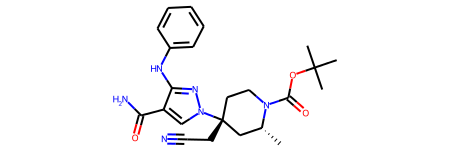

In [172]:
Chem.MolFromSmiles('C[C@@H]1C[C@@](CC#N)(CCN1C(=O)OC(C)(C)C)n2cc(C(=O)N)c(Nc3ccccc3)n2')

In [73]:
# Load classifiers and test set for downstream analysis 
df, smiles_test, activities_test, clf = data_split(assay_name)

Reading data from: datasets/CHEMBL3888429_cleaned.csv


In [52]:
# Get actives and inactives from test set 
actives = []
inactives = []
smiles_actives = []
smiles_inactives = []

for i, s in enumerate(smiles_test):
    mol = Chem.MolFromSmiles(s)
    if float(activities_test[i])==1:
        actives.append(AllChem.GetMorganFingerprintAsBitVect(mol, 2))
        smiles_actives.append(s)
    else:
        inactives.append(AllChem.GetMorganFingerprintAsBitVect(mol, 2))
        smiles_inactives.append(s)


In [19]:
from rdkit import DataStructs

max_sims = []
for i, fp in enumerate(actives + inactives):
    sim = 0
    for j, fp_other in enumerate(actives + inactives):
        if i!=j:
            sim = max(sim, DataStructs.FingerprintSimilarity(fp, fp_other))
    max_sims.append(sim)

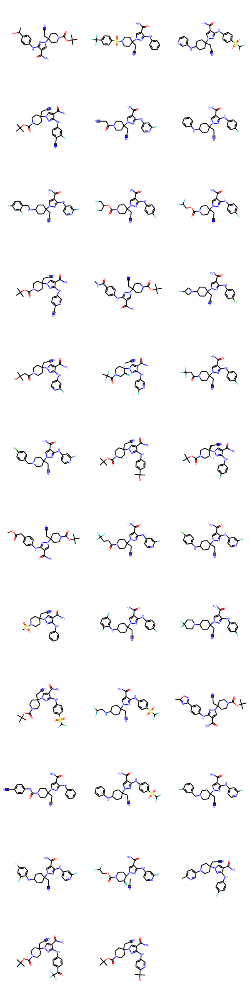

In [23]:
from rdkit.Chem import Draw
from rdkit.Chem import AllChem

Draw.MolsToGridImage([Chem.MolFromSmiles(s) for s in smiles_actives])

In [173]:
smiles_actives[0]

'CC(O)c1ccc(Nc2nn(cc2C(=O)N)C3(CC#N)CCN(CC3)C(=O)OC(C)(C)C)cc1'

In [105]:
frags_1 = []
frags_2 = []
activity = []
patt = Chem.MolFromSmarts("c2nn(cc2C(=O)N)C3(CC#N)CCN(CC3)")
for i, s in enumerate(df.smiles):
    try:
        rm = AllChem.DeleteSubstructs(Chem.MolFromSmiles(s), patt)
        frag_1, frag_2 = Chem.MolToSmiles(rm).split('.')[0], Chem.MolToSmiles(rm).split('.')[1]

        frags_1.append(frag_1)
        frags_2.append(frag_2)
        activity.append(df.value[i])
    except:
        print(s)

CN(C1CCC(CC#N)(CC1)n2cc(C(=O)N)c(Nc3ccnc(F)c3)n2)c4ccccc4
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)NCc4ccccc4Cl
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)NCc4ccccc4F
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)NCc4ccccc4Cl
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)NCc4cccc(Cl)c4
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)NCc4ccccc4F
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)Nc4ccc(F)cc4
CCCCNC(=O)N1CC(CC#N)(C1)n2cc(C(=O)N)c(Nc3ccccc3)n2
NC(=O)c1cn(nc1Nc2ccc(cc2)S(=O)(=O)C(F)F)C3(CC#N)CCC(CC3)N4CCC(O)CC4
NC(=O)c1cn(nc1Nc2ccccc2)C3(CC#N)CN(C3)C(=O)OC4CCCCC4
NC(=O)c1cn(nc1Nc2ccccc2)C3(CC#N)CN(C3)C(=O)NC4CCCCC4
NC(=O)c1cn(nc1Nc2ccc(cc2)S(=O)(=O)C(F)F)C3(CC#N)CCC(CC3)NCC(F)F
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)Nc4ccccc4F
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)Nc4ccc(F)c(F)c4
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)NC4CCCCC4
NC(=O)c1cn(nc1Nc2ccc(cc2)[S+]([O-])C(F)F)C3(CC#N)CCC(CC3)NC4CCCCC4
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)N4CCc5ccccc45
NC(=O)c1cn(nc1Nc2ccnc(F)c2)

NC(=O)c1cn(nc1Nc2ccc(F)cc2)C3(CC#N)CCC(CC3)Nc4ccccc4F
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)NCc4ccc(Cl)cc4
NC(=O)c1cn(nc1Nc2ccccc2)C3(CC#N)CN(C3)S(=O)(=O)C(F)(F)F
CC(C)(C)CC(C)(C)NC(=O)N1CC(CC#N)(C1)n2cc(C(=O)N)c(Nc3ccccc3)n2
NC(=O)c1cn(nc1Nc2ccc(F)cc2)C3(CC#N)CCC(CC3)Nc4ccccn4
NC(=O)c1cn(nc1Nc2ccc(F)cc2)C3(CC#N)CCC(CC3)N4CCC(O)CC4
NC(=O)c1cn(nc1Nc2ccc(F)cc2)C3(CC#N)CCC(CC3)Nc4cccc(F)c4
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)Nc4ccc(Cl)cc4
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)NCc4ccc(F)cc4F
NC(=O)c1cn(nc1Nc2ccc(F)cc2)C3(CC#N)CCC(CC3)N4CCC(O)CC4
CC(C)S(=O)(=O)c1ccc(Nc2nn(cc2C(=O)N)C3(CC#N)CCC(CC3)N4CCC(F)(F)CC4)cc1
CC(C)COC(=O)N1CC(CC#N)(C1)n2cc(C(=O)N)c(Nc3ccccc3)n2
NC(=O)c1cn(nc1Nc2ccccc2)C3(CC#N)CN(C3)C(=O)OC4CCCC4
NC(=O)c1cn(nc1Nc2ccc(F)cc2)C3(CC#N)CCC(CC3)N4Cc5ccccc5C4
COC1CN(C1)C2CCC(CC#N)(CC2)n3cc(C(=O)N)c(Nc4ccnc(F)c4)n3
NC(=O)c1cn(nc1Nc2ccccc2)C3(CC#N)CCOCC3
NC(=O)c1cn(nc1Nc2ccnc(F)c2)C3(CC#N)CCC(CC3)NCc4ccccc4
NC(=O)c1cn(nc1Nc2ccccc2)C3(CC#N)CN(C3)C(=O)OCc4ccncc4

In [80]:
runs

['filters_validity_ecfp4',
 'range_physchem_maxsim_ecfp4',
 'range_qed',
 'maxsim_ecfp6',
 'range_ecfp4_counts',
 'range_physchem_range_ecfp6',
 'smiles_validity_ecfp4',
 'range_physchem_maxsim_ecfp6',
 'range_physchem_range_ecfp4',
 'range_physchem_range_ecfp4_counts',
 'range_physchem',
 'range_physchem_maxsim_ap',
 'range_physchem_range_ap',
 'maxsim_ecfp4',
 'maxsim_ap',
 'range_ecfp4']

In [103]:
len(np.unique(frags_1))

195

In [106]:
array = []
for frag in np.unique(frags_1):
    l = []
    for frag_other in np.unique(frags_2):
        cooccurence = 0
        """for j, fragment in enumerate(frags_1_generated):
            if frag==fragment and frags_2_generated[j] == frag_other:
                cooccurence = 2 #activity[j]
        """
        for j, fragment in enumerate(frags_1):
            if frag==fragment and frags_2[j] == frag_other:
                cooccurence = 1 #activity[j]
        l.append(cooccurence)
    array.append(l)

In [ ]:
for frag in np.unique(frags_1):
    l = []
    for frag_other in np.unique(frags_2):
        cooccurence = 0
        for j, fragment in enumerate(frags_1_generated):
            if frag==fragment and frags_2_generated[j] == frag_other:
                cooccurence = 2 #activity[j]
        l.append(cooccurence)
    array.append(l)

In [109]:
array

range(0, 155)

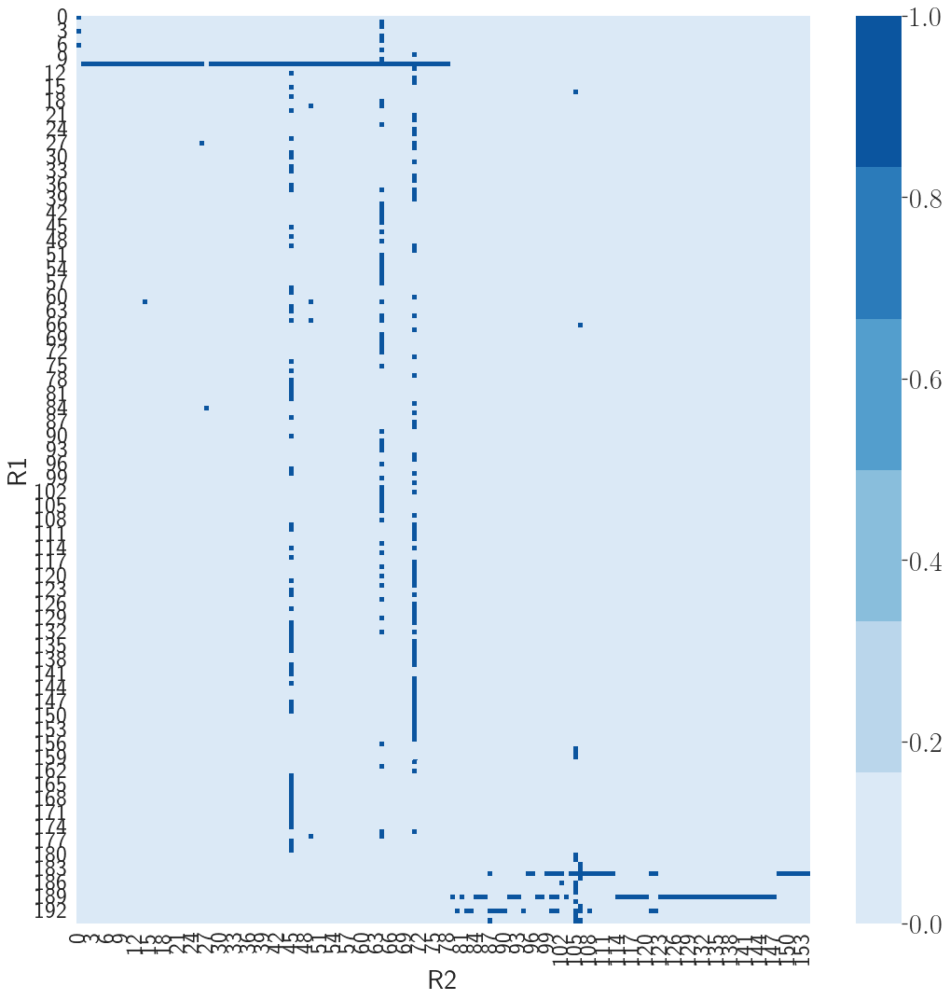

In [169]:
fig, ax = plt.subplots(figsize=(15, 15))

colormap = sns.color_palette("Blues")
  
# creating a heatmap using the colormap
ax = sns.heatmap(array, cmap=colormap, ax=ax)
cbar = ax.collections[0].colorbar
# here set the labelsize by 20
cbar.ax.tick_params(labelsize=30)
plt.tight_layout()
ax.set_xlabel("R2", fontsize=30)
ax.set_ylabel("R1", fontsize=30)

ax.tick_params(axis='both', which='major', labelsize=25)
ax.tick_params(axis='both', which='major', labelsize=25)

"""
labels_xaxis = range(len(np.unique(frags_2)))
labels_yaxis = range(len(np.unique(frags_1)))

ax.set_xticklabels(labels_xaxis, rotation=90)
ax.set_yticklabels(labels_yaxis, rotation=0)
"""
fig.tight_layout(pad=3.0)

plt.tight_layout()
plt.savefig('images/JAK2/cooccurences_generated.svg', dpi=300) 

In [162]:
from rdkit import Chem
from rdkit.Chem import Draw

mols = [Chem.MolFromSmiles('Nc1ccc(F)cc1')]
svg = Draw.MolsToGridImage(mols, molsPerRow=1, useSVG=True)

with open('frag_y_184.svg', 'w') as f:
    f.write(svg.data)

In [151]:
np.unique(frags_1)[10]

'CC(C)(C)OC=O'

In [153]:
np.unique(frags_1)[189]

'Nc1ccccc1'

In [161]:
np.unique(frags_1)[184]

'Nc1ccc(F)cc1'

In [160]:
np.array(array)[184, :]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1])

(array([ 3.,  6., 13., 23., 35., 44., 21., 10.,  0., 12.]),
 array([0.61643836, 0.65479452, 0.69315068, 0.73150685, 0.76986301,
        0.80821918, 0.84657534, 0.88493151, 0.92328767, 0.96164384,
        1.        ]),
 <a list of 10 Patch objects>)

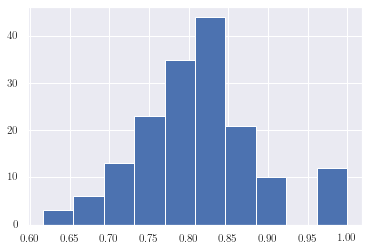

In [20]:
plt.hist(max_sims)

In [7]:
# Extract runs and results from generative models 
runs = []
smiles_list = []
scores_list = []
scores_trajectories = []

print(os.listdir(rundir))

for directory in os.listdir(rundir):
    smiles = []
    scores = []
    trajectories = []
    
    for result_dir in os.listdir(os.path.join(rundir, directory)):
        with open(os.path.join(rundir, directory, result_dir, 'results.json'), 'r') as f:
            results = json.load(f)
            smiles.extend([row['smiles'] for row in results['statistics']][-1])
            scores.extend([row['preds']['scores'] for row in results['statistics']][-1])
            trajectories.extend([np.array(row['preds']['scores']) for row in results['statistics']])
            average_trajectories = np.array([np.array(row['preds']['scores']) for row in results['statistics']])
    if len(smiles)>0:
        runs.append(directory[6:])
        scores_trajectories.append(average_trajectories)
        smiles_list.append(smiles)
        scores_list.append(scores)

['ecfp4_filters_validity_ecfp4', 'ecfp4_range_physchem_maxsim_ecfp4', 'ecfp4_range_qed', 'ecfp4_maxsim_ecfp6', 'ecfp4_range_ecfp4_counts', 'ecfp4_range_physchem_range_ecfp6', 'ecfp4_smiles_validity_ecfp4', 'ecfp4_range_physchem_maxsim_ecfp6', 'ecfp4_range_physchem_range_ecfp4', 'ecfp4_range_physchem_range_ecfp4_counts', 'ecfp4_range_physchem', 'ecfp4_range_physchem_maxsim_ap', 'ecfp4_range_physchem_range_ap', 'ecfp4_maxsim_ecfp4', 'ecfp4_maxsim_ap', 'ecfp4_range_ecfp4']


In [160]:
# Cluster the test set for downstream analysis 
X = np.array(actives + inactives)
clustering = KMeans(n_clusters=5, random_state=0).fit(X)

kmeans_clusters = clustering.labels_
training_set_clusters = ClusterFps(actives + inactives, cutoff=0.5)
centroids = [cluster[0] for cluster in training_set_clusters]
fp_list = actives + inactives
centroids_fp = [fp_list[centroid] for centroid in centroids]

In [10]:
# Get all fingerprints to run all analysis faster 
fps_active_as_array = []
fps_active_as_bitv = []
fps_inactive_as_array = []
fps_inactive_as_bitv = []
fps_generated_as_array = []
fps_generated_as_bitv = []

for s in smiles_actives:
    mol = Chem.MolFromSmiles(s)
    fps_active_as_array.append(np.array(AllChem.GetMorganFingerprintAsBitVect(mol, 2)))
    fps_active_as_bitv.append(AllChem.GetMorganFingerprintAsBitVect(mol, 2))
    
for s in smiles_inactives:
    mol = Chem.MolFromSmiles(s)
    fps_inactive_as_array.append(np.array(AllChem.GetMorganFingerprintAsBitVect(mol, 2)))
    fps_inactive_as_bitv.append(AllChem.GetMorganFingerprintAsBitVect(mol, 2))
    
for i, run in enumerate(runs):
    smiles_generated = smiles_list[i]
    curr_fps_generated_as_array = []
    curr_fps_generated_as_bv = []
    for s in smiles_generated:
        mol = Chem.MolFromSmiles(s)
        curr_fps_generated_as_array.append(np.array(AllChem.GetMorganFingerprintAsBitVect(mol, 2)))
        curr_fps_generated_as_bv.append(AllChem.GetMorganFingerprintAsBitVect(mol, 2))
    fps_generated_as_array.append(curr_fps_generated_as_array)
    fps_generated_as_bitv.append(curr_fps_generated_as_bv)
    

In [162]:
# Fits PCA on test set 
pca = PCA(n_components=2).fit(np.concatenate((fps_inactive_as_array,fps_inactive_as_array)))
pca_active = pca.transform(fps_active_as_array)
pca_inactive = pca.transform(fps_inactive_as_array)

pca_generated = []

for i, run in enumerate(runs):
    curr_fps_generated = fps_generated_as_array[i]
    pca_generated.append(pca.transform(curr_fps_generated))

In [163]:
xmin_ymin = np.amin(np.vstack([np.amin(p, axis=0) for p in pca_generated]), axis=0).tolist()

In [164]:
xmax_ymax = np.amax(np.vstack([np.amax(p, axis=0) for p in pca_generated]), axis=0).tolist()

In [165]:
x_lims = [xmin_ymin[0]] + [xmax_ymax[0]]
y_lims = [xmin_ymin[1]] + [xmax_ymax[1]]

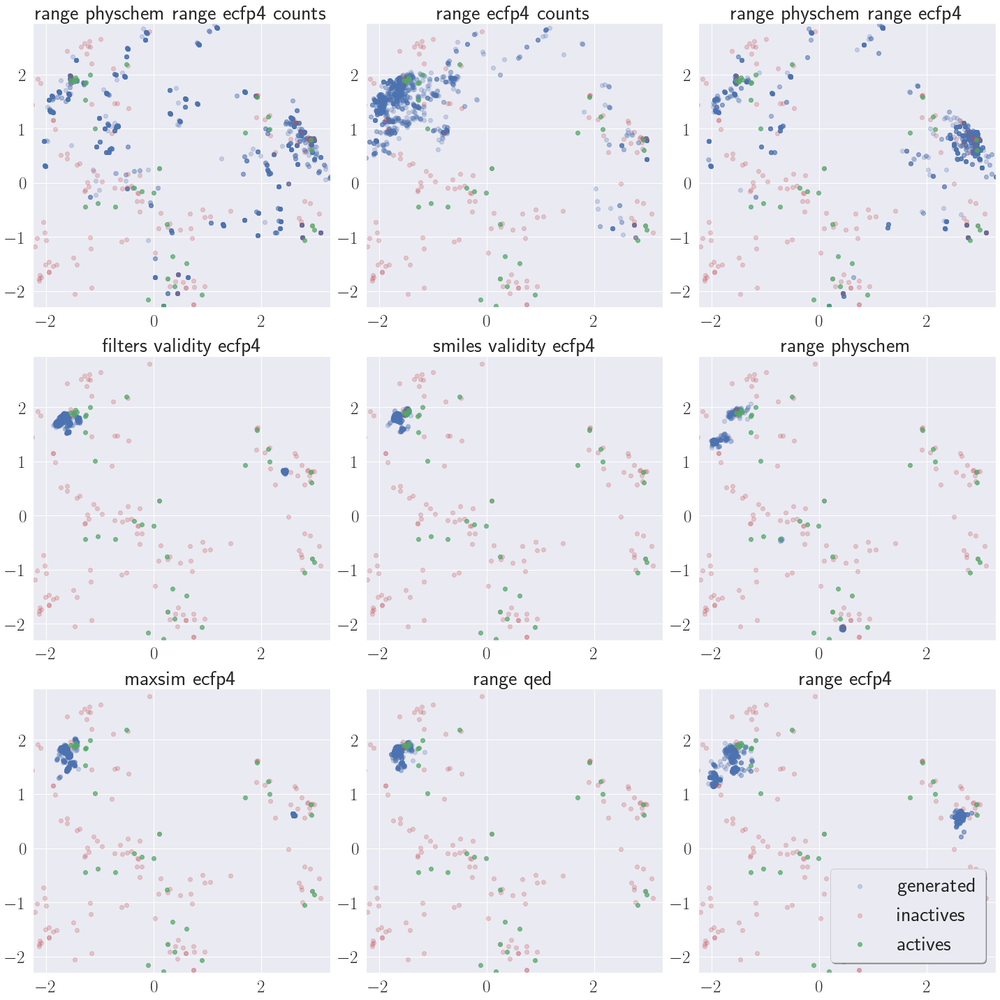

In [166]:
# Displays PCA for selected runs 
runs_to_display = ['range_physchem_range_ecfp4_counts', 'range_ecfp4_counts', 'range_physchem_range_ecfp4',
                   'filters_validity_ecfp4', 'smiles_validity_ecfp4', 'range_physchem', 
                   'maxsim_ecfp4', 'range_qed', 'range_ecfp4']

fig, axs = plt.subplots(figsize = (20, 20), nrows=max(1, math.ceil(len(runs_to_display)/3)) , ncols=3)
fig.tight_layout(pad=1.5)

for i, run in enumerate(runs_to_display):
    index = runs.index(run)
    pca_gen = pca_generated[index]
    ax = axs.flatten()[i]
    ax.set_title(run.replace('_', ' '), fontsize=30)
    ax.set_ylim(y_lims)
    ax.set_xlim(x_lims)
    ax.scatter(pca_gen[:, 0], pca_gen[:, 1], c='b', label = 'generated', alpha=0.25)
    ax.scatter(pca_inactive[:, 0], pca_inactive[:, 1], c='r', label = 'inactives', alpha=0.25)
    ax.scatter(pca_active[:, 0], pca_active[:, 1], c='g', label = 'actives', alpha=0.75)
    ax.tick_params(axis='both', which='major', labelsize=25)
    ax.tick_params(axis='both', which='minor', labelsize=25)
    if i==len(runs_to_display)-1: 
        ax.legend(loc='lower right',
              ncol=1, fancybox=True, shadow=True, fontsize=30)
    
plt.tight_layout()
plt.savefig('images/JAK2/PCA.pdf', dpi=300)   

In [167]:
# Computes entropy for the different runs 
pca_generated = []
entropies = []
clusters = []
    
pca = PCA(n_components=2).fit(np.concatenate((fps_active_as_array,fps_inactive_as_array)))
pca_active = pca.transform(fps_active_as_array)
pca_inactive = pca.transform(fps_inactive_as_array)
predicted_actives = np.where(clf.predict_proba(ecfp4(smiles_actives))[:, 1]>0.5)[0]

for i, run in enumerate(runs):
    curr_fps_generated = fps_generated_as_array[i]
    curr_fps_generated_bitv = fps_generated_as_bitv[i]    
    pca_generated.append(pca.transform(curr_fps_generated))
    if kmeans:
        curr_clusters = clustering.predict(curr_fps_generated)  
    else:
        curr_clusters = [find_cluster(fp, centroids_fp) for fp in curr_fps_generated_bitv]
    probs = []
    for i in range(len(np.unique(centroids))):
        probs.append(len(np.where(np.array(curr_clusters)==i)[0])/len(curr_clusters))
    entropy = scipy.stats.entropy(probs)/ np.log(len(curr_clusters))
    clusters.append(curr_clusters)
    entropies.append(entropy)

In [168]:
xmin_ymin = np.amin(np.vstack([np.amin(p, axis=0) for p in pca_generated]), axis=0).tolist()
xmax_ymax = np.amax(np.vstack([np.amax(p, axis=0) for p in pca_generated]), axis=0).tolist()
x_lims = [xmin_ymin[0]] + [xmax_ymax[0]]
y_lims = [xmin_ymin[1]] + [xmax_ymax[1]]

Text(0.5, 1.05, 'PCA projections of generated molecules in the training set actives/inactives space\nHighlighting predicted actives')

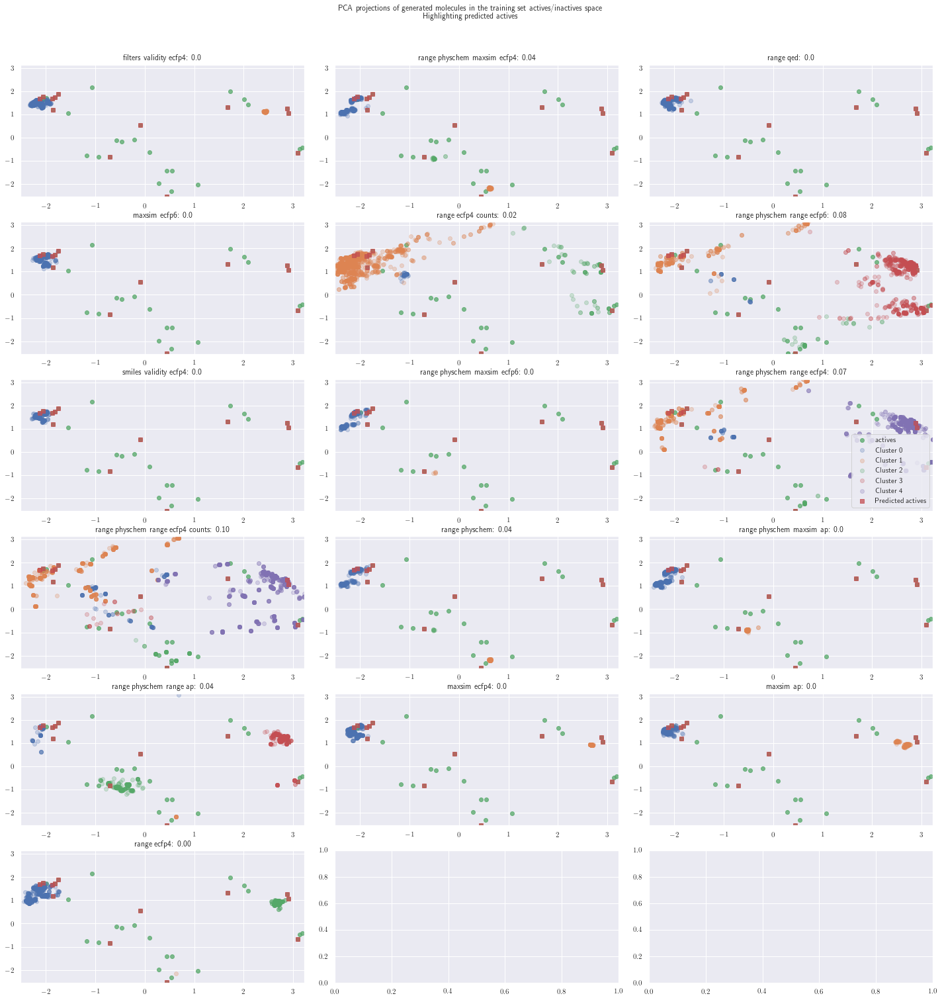

In [169]:
# PCA projection of generated sets with color by clusters
fig, axs = plt.subplots(figsize = (20, 20), nrows=max(1, math.ceil(len(runs)/3)) , ncols=3)
fig.tight_layout(pad=1.5)
no_legend = 0

for i, run in enumerate(runs):
    curr_clusters = clusters[i]
    entropy = entropies[i]
    pca_gen = pca_generated[i]
    ax = axs.flatten()[i]
    ax.set_title(run.replace('_', ' ') + ': ' + str(entropy)[:4])
    ax.set_ylim(y_lims)
    ax.set_xlim(x_lims)
    ax.scatter(pca_active[:, 0], pca_active[:, 1], c='g', label = 'actives', alpha=0.75)    
    for c in np.unique(curr_clusters):
        ax.scatter(pca_gen[:, 0][np.where(curr_clusters==c)], pca_gen[:, 1][np.where(curr_clusters==c)], label= 'Cluster ' + str(c), alpha=0.25)    

    ax.scatter(pca_active[predicted_actives, 0], pca_active[predicted_actives, 1], c='r', label = 'Predicted actives', alpha=0.75, marker='s')
    #ax.scatter(pca_inactive[:, 0], pca_inactive[:, 1], c='r', label = 'inactives', alpha=0.25)
    if len(np.unique(curr_clusters)) == np.amax([len(set(c)) for c in clusters]) and  no_legend == 0 :
        ax.legend(loc=4)
        no_legend = 1
fig.suptitle('PCA projections of generated molecules in the training set actives/inactives space\nHighlighting predicted actives',fontweight ="bold", y=1.05)    

<Figure size 1800x1800 with 0 Axes>

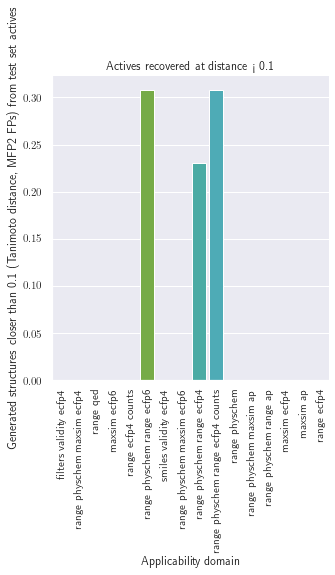

In [170]:
# Displays proportion of actives recovered at distance < 0.1 
fig = plt.figure(figsize=(25, 25))
novel_01 = []
titles = []

predicted_actives = np.where(clf.predict_proba(ecfp4(smiles_actives))[:, 1]>0.5)[0]

for i, run in enumerate(runs):
    curr_fps_generated = fps_generated_as_bitv[i]
    n_new = 0
    for s in np.array(smiles_actives)[predicted_actives]:
        mol = Chem.MolFromSmiles(s)
        if max_tanimoto_similarity([AllChem.GetMorganFingerprintAsBitVect(mol, 2)], curr_fps_generated)>0.9:
            n_new += 1
    novel_01.append(n_new/len(predicted_actives))
    titles.append(run.replace('_', ' '))
    
display_df = pd.DataFrame(zip(titles, novel_01), columns =['Applicability domain', 'Generated structures closer than 0.1 (Tanimoto distance, MFP2 FPs) from test set actives'])
chart = sns.catplot(x="Applicability domain", y="Generated structures closer than 0.1 (Tanimoto distance, MFP2 FPs) from test set actives", kind="bar", data=display_df)
for axes in chart.axes.flat:
    _ = axes.set_xticklabels(axes.get_xticklabels(), rotation=90)
plt.title("Actives recovered at distance < 0.1")
plt.show()

#plt.barh(np.arange(len(novel_01)), novel_01, height = 0.25 , label='fraction of actives recovered at distance < 0.1')
#plt.yticks(ticks = np.arange(len(novel_01)), labels = titles, rotation='horizontal')
#plt.legend(loc=0)
   
#fig.suptitle('Fraction of predicted actives in the dataset at distance < 0.1',fontweight ="bold")

/opt/local/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator


<Figure size 1080x1080 with 0 Axes>

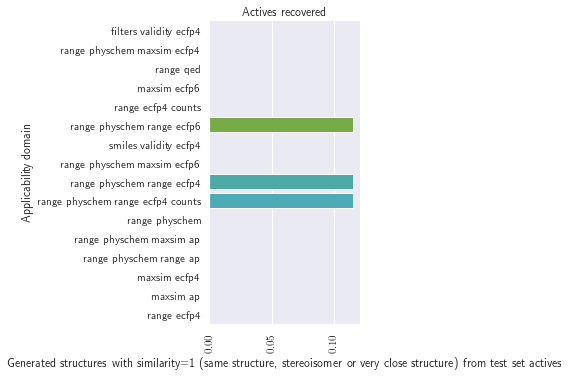

In [171]:
# Displays proportion of actives recovered 
fig = plt.figure(figsize=(15, 15))
novel_recovered = []
titles = []


for i, run in enumerate(runs):
    smiles_generated = smiles_list[i]
    fps_generated = []
    for s in smiles_generated:
        mol = Chem.MolFromSmiles(s)
        fps_generated.append(AllChem.GetMorganFingerprintAsBitVect(mol, 2))
    n_new = 0
    for s in np.array(smiles_actives)[predicted_actives]:
        mol = Chem.MolFromSmiles(s)
        if max_tanimoto_similarity([AllChem.GetMorganFingerprintAsBitVect(mol, 2)], fps_generated)>0.99:
            n_new += 1
    novel_recovered.append(n_new/len(predicted_actives))
    titles.append(run.replace('_', ' '))
display_df = pd.DataFrame(zip(titles, novel_recovered), columns =['Applicability domain', 'Generated structures with similarity=1 (same structure, stereoisomer or very close structure) from test set actives'])
chart = sns.catplot(y="Applicability domain", x="Generated structures with similarity=1 (same structure, stereoisomer or very close structure) from test set actives", kind="bar", data=display_df)
for axes in chart.axes.flat:
    _ = axes.set_xticklabels(axes.get_xticklabels(), rotation=90)
plt.title("Actives recovered")
plt.show()

In [221]:
# Computes distances to training set molecules to display enrichment 
training_set_molecules_predicted_actives = np.where(clf.predict_proba(ecfp4(smiles_actives+smiles_inactives))[:, 1]>0.5)[0]
training_set_molecules_predicted_inactives = np.where(clf.predict_proba(ecfp4(smiles_actives+smiles_inactives))[:, 1]<=0.5)[0]
average_similarities = []
max_similarities_actives = []
max_similarities_inactives = []
similarities_actives = []
similarities_inactives = []
similarities_to_closest_actives = []
similarities_to_closest_inactives = []
similarities_to_closest_predicted_actives = []
similarities_to_closest_predicted_inactives = []

ordered_runs = ['maxsim_ecfp4',
                'range_physchem_range_ecfp4_counts']
labels = [
 'maxsim ecfp4',
 
 'range physchem + range ecfp4 counts',]

for i, run in enumerate(ordered_runs):
    curr_fps_generated = fps_generated_as_bitv[runs.index(run)]
    average_similarities.append(average_tanimoto_similarity(fps_active_as_bitv, curr_fps_generated))
    max_similarities_actives.append(max_tanimoto_similarity(fps_active_as_bitv, curr_fps_generated))
    max_similarities_inactives.append(max_tanimoto_similarity(fps_active_as_bitv, curr_fps_generated))
    similarities_actives.append(tanimoto_similarities(fps_active_as_bitv, curr_fps_generated))
    similarities_inactives.append(tanimoto_similarities(fps_inactive_as_bitv, curr_fps_generated))
    curr_similarities_to_closest_actives = []
    for fp in fps_active_as_bitv:
        curr_similarities_to_closest_actives.append(max_tanimoto_similarity([fp], curr_fps_generated))
    similarities_to_closest_actives.append(curr_similarities_to_closest_actives)
    curr_similarities_to_closest_inactives = []
    for fp in fps_inactive_as_bitv:
        curr_similarities_to_closest_inactives.append(max_tanimoto_similarity([fp], curr_fps_generated))
    similarities_to_closest_inactives.append(curr_similarities_to_closest_inactives)
    curr_similarities_to_closest_predicted_actives = []
    curr_similarities_to_closest_predicted_inactives = []
    for j, fp in enumerate(fps_active_as_bitv + fps_inactive_as_bitv):
        if j in training_set_molecules_predicted_actives:
            curr_similarities_to_closest_predicted_actives.append(max_tanimoto_similarity([fp], curr_fps_generated))
        if j in training_set_molecules_predicted_inactives:
            curr_similarities_to_closest_predicted_inactives.append(max_tanimoto_similarity([fp], curr_fps_generated))
    similarities_to_closest_predicted_actives.append(curr_similarities_to_closest_predicted_inactives)
    similarities_to_closest_predicted_inactives.append(curr_similarities_to_closest_predicted_inactives)

In [222]:
# Computes distances to training set molecules to display enrichment 
active_neighbours = []
inactive_neighbours = []

for i, run in enumerate(ordered_runs):
    active_sims = similarities_to_closest_actives[i]
    inactive_sims = similarities_to_closest_inactives[i]
        
    active_sims = np.array(active_sims)
    inactive_sims = np.array(inactive_sims)
    
    sim_tresholds = [0.95, 0.9, 0.85, 0.8, 0.75, 0.7, 0.6, 0.5, 0]
    curr_active_neighbours = []
    curr_inactive_neighbours = []
    sim_tresholds.reverse()
    for s in sim_tresholds:
        try:
            curr_active_neighbours.append(len(np.where(active_sims>s)[0]))
        except:
            curr_active_neighbours.append(0)
        try:
            curr_inactive_neighbours.append(len(np.where(inactive_sims>s)[0]))
            
        except:
            curr_inactive_neighbours.append(0)
    active_neighbours.append(curr_active_neighbours)
    inactive_neighbours.append(curr_inactive_neighbours)

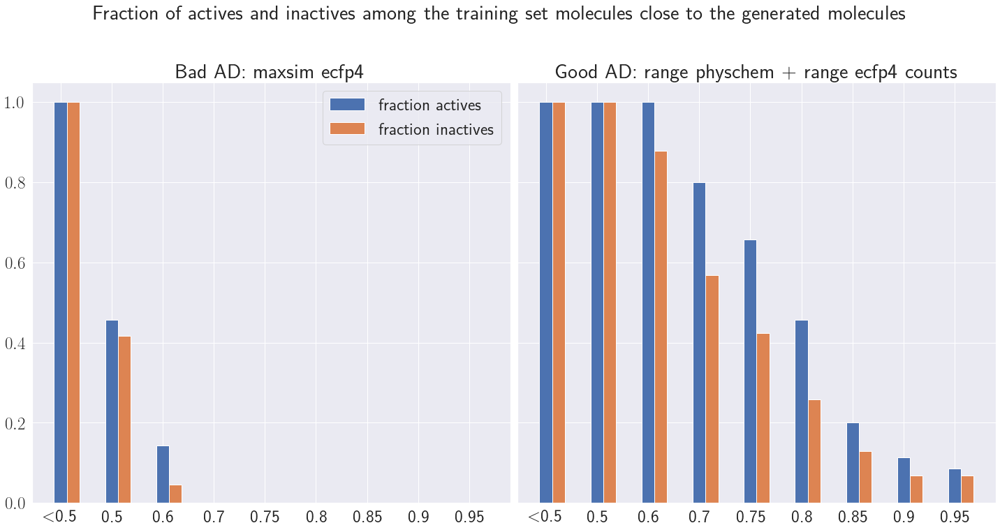

In [174]:
# Compares enrichment on a good and a bad AD 
labels = ['Bad AD: maxsim ecfp4', 'Good AD: range physchem + range ecfp4 counts']
fig, axs = plt.subplots(figsize = (20, 10), nrows=max(1, math.ceil(len(ordered_runs)/2)) , ncols=2, sharey=True)
fig.tight_layout(pad=1.5)
fig.suptitle('Fraction of actives and inactives among the training set molecules close to the generated molecules',fontsize=30, y = 1.05)

for i, run in enumerate(ordered_runs):
    curr_active_neighbours = active_neighbours[i]
    curr_inactive_neighbours = inactive_neighbours[i]
    ax = axs.flatten()[i]
    ax.set_title(labels[i], fontsize=30)
    ax.bar(np.arange(len(sim_tresholds)), np.array(curr_active_neighbours)/len(fps_active_as_bitv), width=0.25, label='fraction actives')
    ax.bar(np.arange(len(sim_tresholds))+ 0.25, np.array(curr_inactive_neighbours)/len(fps_inactive_as_bitv), width=0.25, label='fraction inactives')
    
    ax.set_xticks(np.arange(len(sim_tresholds)))
    ax.set_xticklabels(['$<$0.5'] + sim_tresholds[1:])
    ax.tick_params(axis='both', which='major', labelsize=25)

    ax.set_ylim(0, 1.05)
    if i == 0 :
        ax.legend(loc=0, fontsize=25)
        
plt.tight_layout()
plt.savefig('images/JAK2/enrichment.pdf', dpi=300)

In [175]:
# Computes QED and SAS for the test set 
qed_dataset = []
sas_dataset = []
for s in smiles_actives + smiles_inactives:
    mol = Chem.MolFromSmiles(s)
    qed_dataset.append(Descriptors.qed(mol))
    sas_dataset.append(calculateScore(mol))

In [176]:
# Computes QED and SAS for generated sets 
QED = []
SAS = []

SAS_for_results = []
QED_for_results = []
ad = []
for i, run in enumerate(runs):
    avg_sims = []
    max_sim = []
    smiles_generated = smiles_list[i]
    qed_generated = []
    sas_generated = []
    for s in smiles_generated:
        mol = Chem.MolFromSmiles(s)
        qed_generated.append(Descriptors.qed(mol))
        sas_generated.append(calculateScore(mol))

    
        
        QED.append(Descriptors.qed(mol))
        SAS.append(calculateScore(mol))
        ad.append(run)
    SAS_for_results.append(sas_generated)
    QED_for_results.append(qed_generated)

In [254]:
runs
indexes = [runs.index('range_physchem')]

In [238]:
np.array(SAS_for_results)[indexes].shape

(2, 1280)

In [237]:
indexes

[9, 10]

In [239]:
np.array([x.replace('_', ' ') for x in runs])[indexes]

array(['range physchem range ecfp4 counts', 'range physchem'],
      dtype='<U33')

In [243]:
np.array(SAS_for_results)[indexes, :].shape

(2, 1280)

In [241]:
np.array([x.replace('_', ' ') for x in runs])[indexes].shape

(2,)

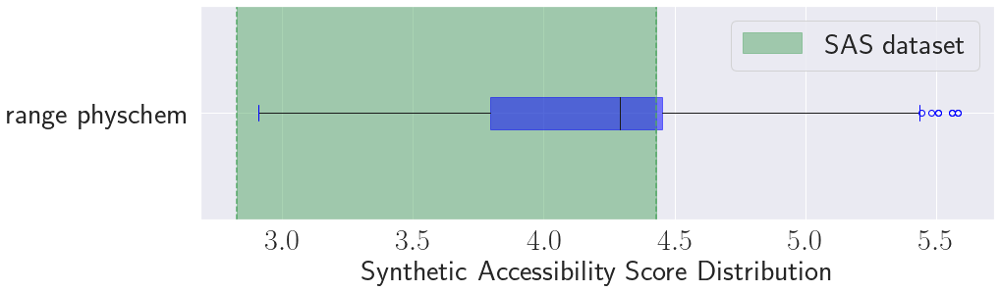

In [255]:
# Plots SAS distributions 
matplotlib.rcParams.update({'font.size': 35})

plt.figure(figsize= (15, 5))

c = 'blue'
box = plt.boxplot([SAS_for_results[runs.index('range_ecfp4')]], labels = np.array([x.replace('_', ' ') for x in runs])[indexes], vert=False, patch_artist=True,
            boxprops=dict(facecolor=c, color=c, alpha=0.5),
            capprops=dict(color=c),
            whiskerprops=dict(color='k'),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color='k'),)



plt.axvline(np.percentile(sas_dataset, 100), ls='--', c='g')
plt.axvline(np.percentile(sas_dataset, 0), ls='--', c='g')
xmin, xmax, ymin, ymax = plt.axis()
plt.fill_between([np.percentile(sas_dataset, 0), np.percentile(sas_dataset, 100)], ymin, ymax, color='g', alpha=0.5, label = 'SAS dataset')
plt.xlabel("Synthetic Accessibility Score Distribution", fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.legend(fontsize=30)

plt.tight_layout()
#plt.savefig('images/JAK2/SAS_distribution.pdf', dpi=300)

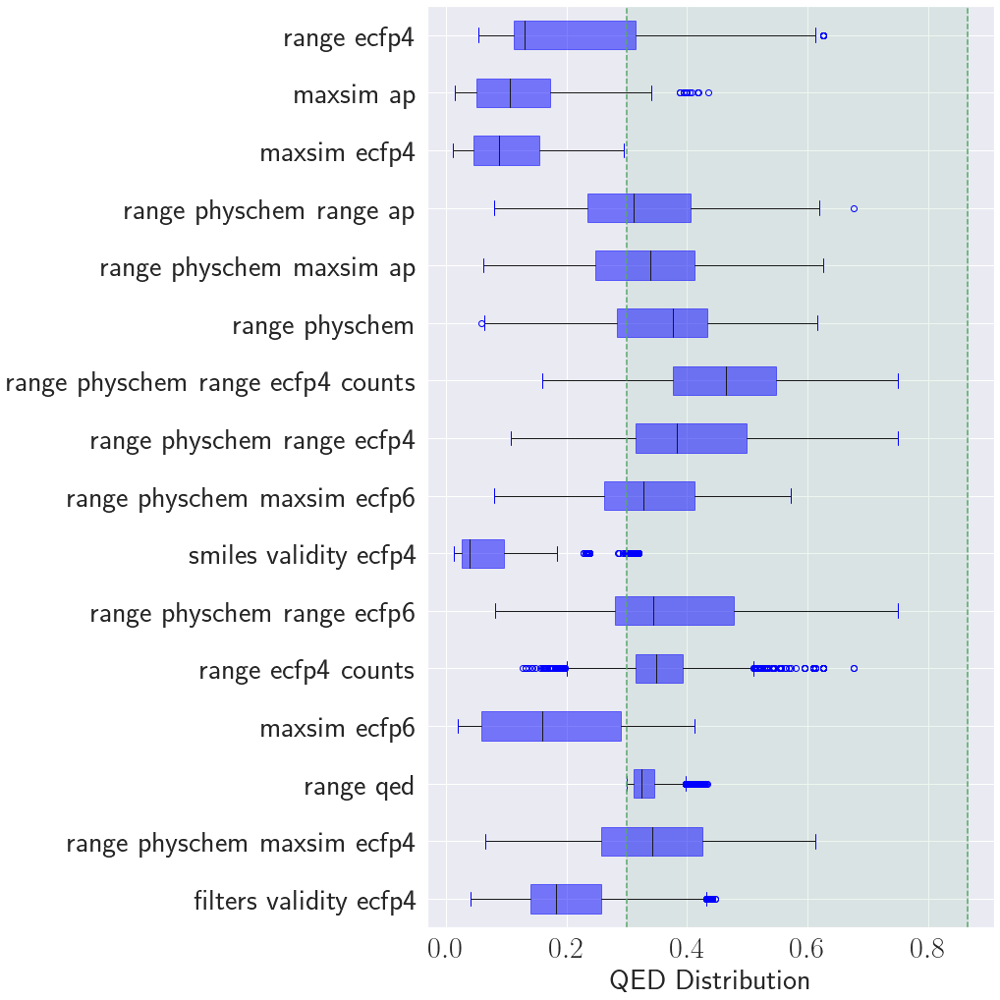

In [178]:
# Plots QED distributions 
plt.figure(figsize= (15, 15))
c = 'blue'
box = plt.boxplot(QED_for_results, labels = [x.replace('_', ' ') for x in runs], vert=False, patch_artist=True,
            boxprops=dict(facecolor=c, color=c, alpha=0.5),
            capprops=dict(color=c),
            whiskerprops=dict(color='k'),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color='k'),)

plt.axvline(np.percentile(qed_dataset, 100), ls='--', label='Dataset extreme QED values', c='g')
plt.axvline(np.percentile(qed_dataset, 0), ls='--', c='g')
xmin, xmax, ymin, ymax = plt.axis()
plt.fill_between([np.percentile(qed_dataset, 0), np.percentile(qed_dataset, 100)], ymin, ymax, color='g', alpha=0.1, label = 'Valid QED')
plt.xlabel("QED Distribution", fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)


plt.tight_layout()
plt.savefig('images/JAK2/QED_distribution.pdf', dpi=300)

# Comparing different AD's outputs

In [179]:
from utils import qualitative_analysis, return_distribution_cycle_size, return_distribution_mw, return_distribution_halogen, return_distribution_heteroatoms, return_distribution_radicals, return_distribution_sulphur, qualitative_analysis

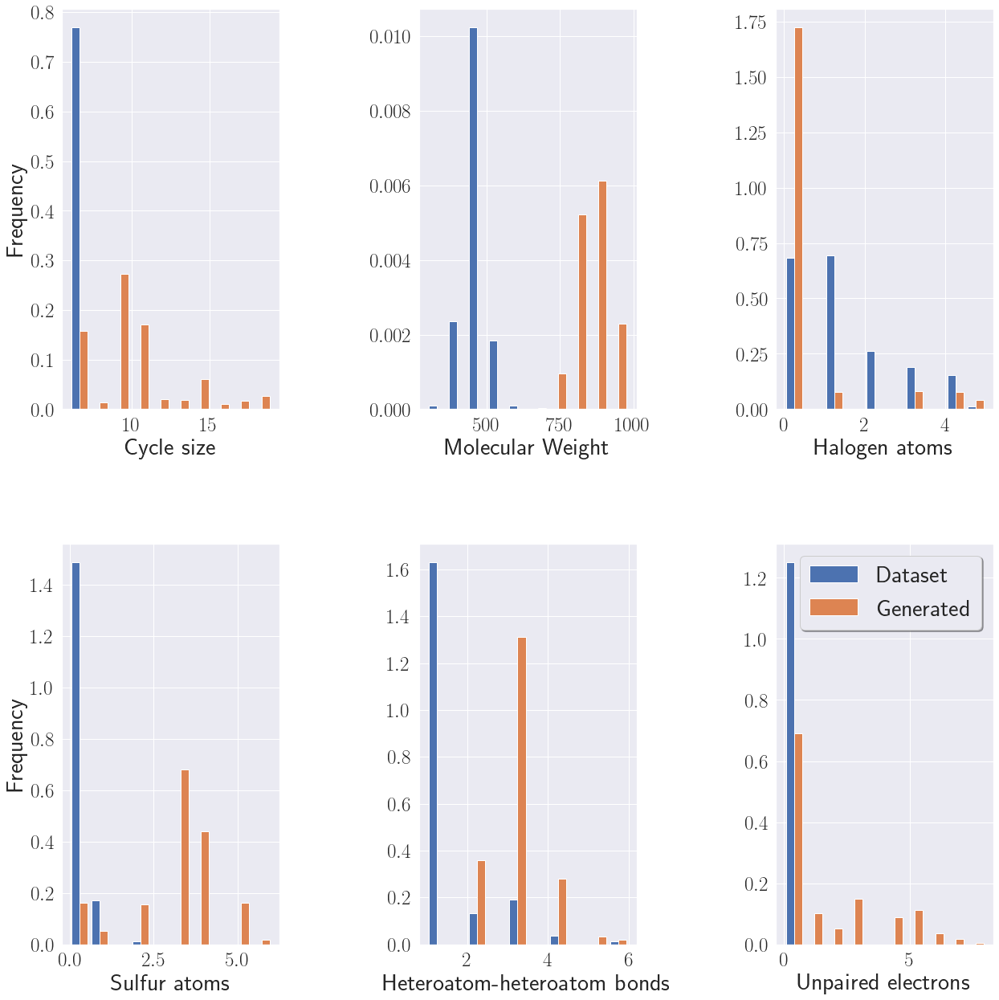

In [180]:
# Example on maxsim AP applicability domain of comparison of properties distribution with the test set 
properties = ['cycle_size', 'mw', 'halogen', 'sulphur', 'heteroatoms', 'radicals']
properties_name = ['Cycle size', 'Molecular Weight', 'Halogen atoms', 'Sulfur atoms', 'Heteroatom-heteroatom bonds', 'Unpaired electrons']

fig, axs = plt.subplots(figsize = (20, 20), nrows=max(1, math.ceil(len(properties)/3)) , ncols=3)

fig.tight_layout(pad=1.5)
for i, prop in enumerate(properties):
    ax = axs.flatten()[i]
    ax.set_xlabel(properties_name[i], fontsize=30)
    ref_distribution = locals()["return_distribution_" + prop](smiles_test)
    generated_distribution = locals()["return_distribution_" + prop](smiles_list[0])
    if i%3==0:
        ax.set_ylabel("Frequency", fontsize=30)
    ax.hist([ref_distribution, generated_distribution], label=['Dataset', 'Generated'], density=True)
    if i==len(properties)-1:
        ax.legend(loc='upper right',
              ncol=1, fancybox=True, shadow=True, fontsize=30)
    ax.tick_params(axis='both', which='major', labelsize=25)
    ax.tick_params(axis='both', which='minor', labelsize=25)
fig.tight_layout(pad=3.0)


In [8]:
best_methods = ['range_physchem_range_ap', 'range_ecfp4_counts', 'range_physchem_range_ecfp4_counts', 'range_physchem_range_ecfp6', 'range_physchem_range_ecfp4']

In [11]:
# Computes average similarities between runs from the "best methods"
average_similarities = []
max_similarities = []
common_molecules = {}
for i, run in enumerate(best_methods):
    avg_sims = []
    max_sim = []
    smiles_generated = smiles_list[i]
    fps_generated = fps_generated_as_bitv[i]
    for j, comparison_run in enumerate(best_methods):
        smiles_generated = smiles_list[j]
        fps_other = fps_generated_as_bitv[j]
        if j<i:
            indexes, indexes_other = indexes_identical_fps(fps_generated, fps_other)
            common_molecules[run + '_vs_' + comparison_run] = [indexes, indexes_other] 
        avg_sims.append(average_tanimoto_similarity(fps_generated, fps_other))
        max_sim.append(max_tanimoto_similarity(fps_generated, fps_other))
    average_similarities.append(avg_sims)
    max_similarities.append(max_sim)

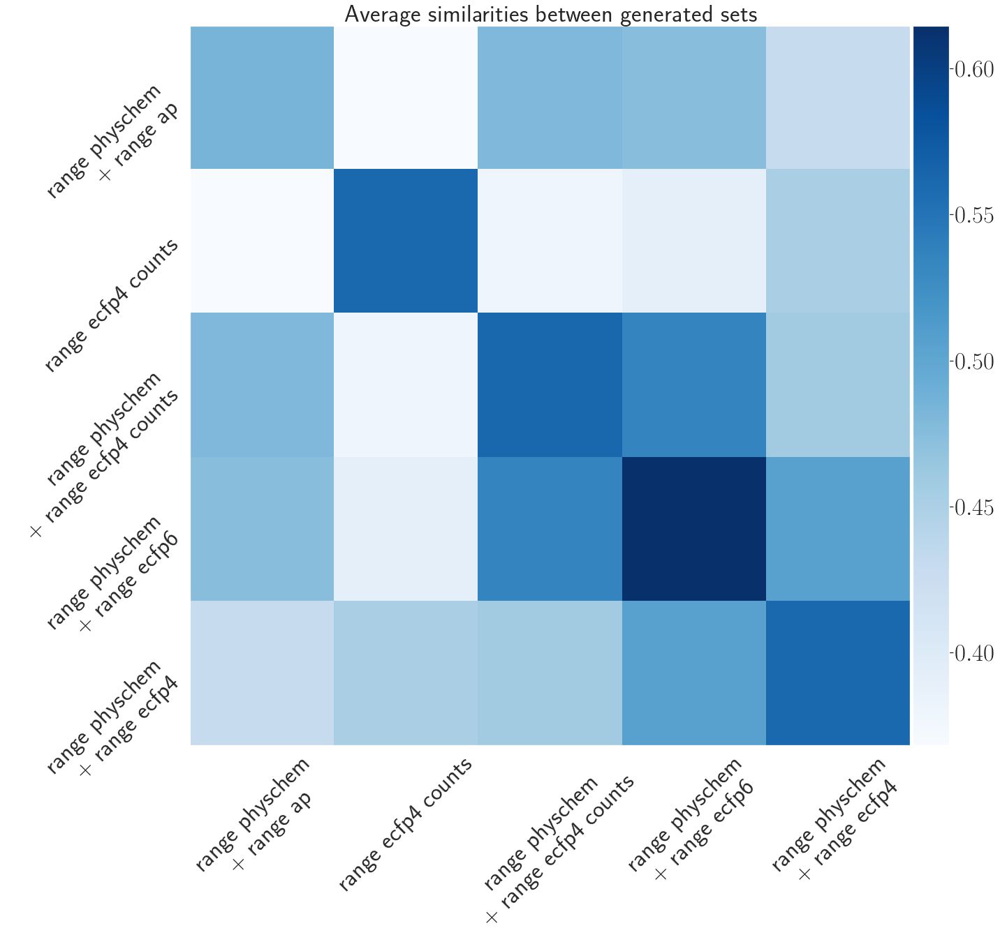

In [15]:
# Displays average generated set - generated set similarities 
from mpl_toolkits.axes_grid1 import make_axes_locatable

labels = ['range physchem + range ap', 'range ecfp4 counts', 'range physchem + range ecfp4 counts', 'range physchem + range ecfp6', 'range physchem + range ecfp4']
labels_xaxis = ['range physchem \n + range ap', 'range ecfp4 counts', 'range physchem \n + range ecfp4 counts', 'range physchem \n + range ecfp6', 'range physchem \n + range ecfp4']


fig, ax = plt.subplots(figsize = (20, 20), nrows=1 , ncols=1)

fig.tight_layout(pad=1.5)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)



ax.set_title("Average similarities between generated sets", fontsize=35)

im = ax.imshow(np.array(average_similarities), cmap='Blues')
ax.set_yticks(ticks=range(len(best_methods)))
ax.set_xticks(ticks=range(len(best_methods)))
ax.set_xticklabels(labels_xaxis, rotation=45)
ax.set_yticklabels(labels_xaxis, rotation=45)
ax.tick_params(axis='both', which='major', labelsize=35)
ax.tick_params(axis='both', which='minor', labelsize=35)
#plt.colorbar()
fig.tight_layout(pad=3.0)
cbar = plt.colorbar(im, cax=cax, orientation='vertical')
ax.grid(False)
cbar.ax.tick_params(labelsize=35)

plt.tight_layout()
plt.savefig('images/JAK2/similarities.pdf', dpi=300)

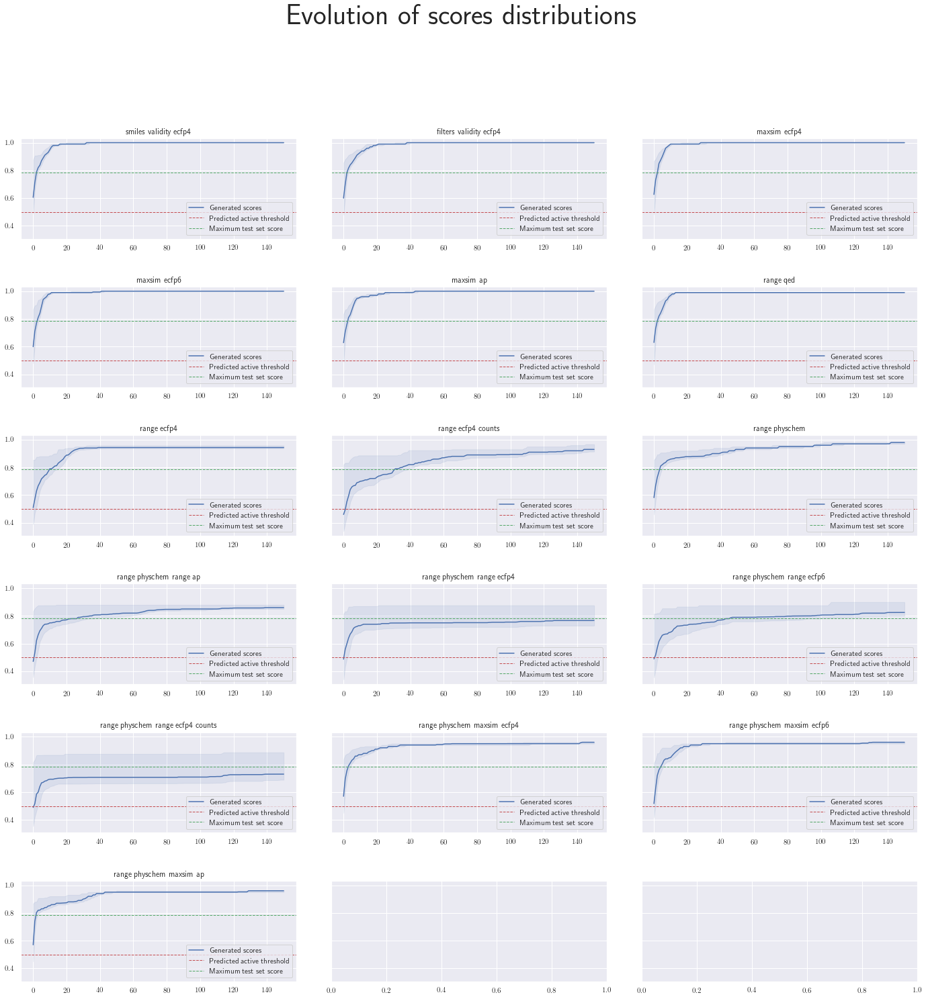

In [184]:
# Scores distribution throughout optimization for the different AD
ordered_runs = ['smiles_validity_ecfp4', 'filters_validity_ecfp4', 'maxsim_ecfp4', 'maxsim_ecfp6', 'maxsim_ap', 'range_qed',
                'range_ecfp4', 'range_ecfp4_counts', 'range_physchem', 'range_physchem_range_ap', 'range_physchem_range_ecfp4', 'range_physchem_range_ecfp6',
                'range_physchem_range_ecfp4_counts', 'range_physchem_maxsim_ecfp4', 'range_physchem_maxsim_ecfp6', 
                'range_physchem_maxsim_ap']
fig, axs = plt.subplots(figsize = (20, 20), nrows=max(1, math.ceil(len(ordered_runs)/3)) , ncols=3, sharey=True)

fig.tight_layout(pad=1.5)

for i, run in enumerate(ordered_runs):
    ax = axs.flatten()[i]
    ax.set_title(run.replace('_', ' '))
    scores = np.array(scores_trajectories[runs.index(run)])
    median = np.median(scores, 1)
    q25 = np.percentile(scores, 5, axis=1)
    q75 = np.percentile(scores, 95, axis=1)
    ax.plot(median, c='b', label='Generated scores')
    ax.fill_between(
        np.arange(median.shape[0]), q25, q75, alpha=.1, color='b')
    ax.axhline(y=0.5, linewidth=1, ls='--', color='r', label='Predicted active threshold')
    ax.axhline(y=np.max(scores_test), linewidth=1, ls='--', color='g', label='Maximum test set score')
    ax.legend(loc=4)
fig.suptitle('Evolution of scores distributions', fontweight ="bold", y=1.05)
plt.tight_layout()
plt.savefig('images/JAK2/scores_distribution.pdf', dpi=300)

In [185]:
# Computes properties for general analysis of the results 
internal_diversity = [average_tanimoto_similarity(fps_generated_as_bitv[i],  fps_generated_as_bitv[i]) for i in range(len(runs))]
average_scores = np.mean(scores_list, axis=1)
mean_dataset = np.mean(scores_test)
average_SAS = np.mean(SAS_for_results, axis=1)
average_QED = np.mean(QED_for_results, axis=1)
top_SAS = np.percentile(sas_dataset, 95)
bottom_QED = np.percentile(qed_dataset, 5)
quantitative_analysis_results = [quantitative_analysis(smiles, smiles_test) for smiles in smiles_list]
cycle_size = [x[0] for x in quantitative_analysis_results]
mw = [x[1] for x in quantitative_analysis_results]
heteroatoms = [x[2] for x in quantitative_analysis_results]
radicals = [x[3] for x in quantitative_analysis_results]

In [186]:
# Global results 
import pandas as pd 
ordered_runs = ['smiles_validity_ecfp4', 'filters_validity_ecfp4', 'maxsim_ecfp4', 'maxsim_ecfp6', 'maxsim_ap', 'range_qed',
                'range_ecfp4', 'range_ecfp4_counts', 'range_physchem', 'range_physchem_range_ap', 'range_physchem_range_ecfp4', 'range_physchem_range_ecfp6',
                'range_physchem_range_ecfp4_counts', 'range_physchem_maxsim_ecfp4', 'range_physchem_maxsim_ecfp6', 
                'range_physchem_maxsim_ap']
df = pd.DataFrame(list(zip(entropies, 1 - np.array(internal_diversity), [x*100 for x in novel_01], [x*100 for x in novel_recovered],
                           100 * np.array([np.mean(x<top_SAS) for x in SAS_for_results]),
                           100 * np.array([np.mean(x>bottom_QED) for x in QED_for_results]), cycle_size, mw, heteroatoms, radicals)),
               columns =['Entropies', 'Internal diversity','Actives recovered at distance <0.1', 
                         'Actives recovered', 'Valid SAS', 'Valid QED', 'Valid cycle sizes',
                        'Valid MW', 'Valid het-het bonds', 'Unpaired electrons'],
                 index = runs)

df = df.reindex(ordered_runs)
df = df.round({'Entropies': 2, 'Internal diversity': 2, 'Actives recovered at distance <0.1': 1, 
                         'Actives recovered':1, 'Valid SAS':1, 'Valid QED':1, 'Valid cycle sizes':1,
                        'Valid MW':1, 'Valid het-het bonds':1, 'Unpaired electrons':1})

df_dummy = pd.DataFrame(list(zip([0, 1], [0, 1], [0, 100], [0, 100], [0, 100], [0, 100], [0, 100], [0, 100], [0, 100], [0, 100])),
               columns =['Entropies', 'Internal diversity','Actives recovered at distance <0.1', 
                         'Actives recovered', 'Valid SAS', 'Valid QED', 'Valid cycle sizes',
                        'Valid MW', 'Valid het-het bonds', 'Unpaired electrons'],
                 index = ["dummy_low", "dummy_high"])
df = df.append(df_dummy)
s = df.style.background_gradient(cmap = 'BuGn', axis = 0, subset=['Entropies', 'Actives recovered at distance <0.1',
       'Actives recovered', 'Valid SAS',
       'Valid QED', 'Internal diversity', 'Valid cycle sizes',
                        'Valid MW', 'Valid het-het bonds', 'Unpaired electrons'])
s.format({'Entropies': "{:.2f}", 'Internal diversity': "{:.2f}", 'Actives recovered at distance <0.1': "{:.1f}", 
                         'Actives recovered':"{:.1f}", 'Valid SAS':"{:.1f}", 'Valid QED':"{:.1f}", 'Valid cycle sizes':"{:.1f}",
                        'Valid MW':"{:.1f}", 'Valid het-het bonds':"{:.1f}", 'Unpaired electrons':"{:.1f}"})


,Entropies,Internal diversity,Actives recovered at distance <0.1,Actives recovered,Valid SAS,Valid QED,Valid cycle sizes,Valid MW,Valid het-het bonds,Unpaired electrons
smiles_validity_ecfp4,0.00,0.41,0.0,0.0,0.0,0.0,0.8,0.0,3.4,49.7
filters_validity_ecfp4,0.00,0.52,0.0,0.0,2.8,18.0,18.8,0.0,100.0,55.2
maxsim_ecfp4,0.00,0.50,0.0,0.0,0.0,0.0,10.0,0.0,34.7,69.9
maxsim_ecfp6,0.00,0.39,0.0,0.0,0.0,6.3,0.0,0.0,30.5,53.0
maxsim_ap,0.00,0.53,0.0,0.0,0.0,0.9,17.6,0.0,64.6,22.3
range_qed,0.00,0.44,0.0,0.0,0.0,16.5,0.0,0.0,66.2,49.8
range_ecfp4,0.00,0.44,0.0,0.0,32.7,14.8,27.8,1.6,100.0,100.0
range_ecfp4_counts,0.02,0.44,0.0,0.0,61.7,29.5,71.7,19.1,100.0,100.0
range_physchem,0.05,0.43,0.0,0.0,23.0,51.0,100.0,100.0,99.8,8.6
range_physchem_range_ap,0.05,0.43,0.0,0.0,51.7,37.8,100.0,100.0,99.8,29.3


In [187]:
# Get latex code to display as table in article manuscript 
string = s.to_latex(convert_css=True)
string

'\\begin{tabular}{lrrrrrrrrrr}\n{} & {Entropies} & {Internal diversity} & {Actives recovered at distance <0.1} & {Actives recovered} & {Valid SAS} & {Valid QED} & {Valid cycle sizes} & {Valid MW} & {Valid het-het bonds} & {Unpaired electrons} \\\\\nsmiles_validity_ecfp4 & {\\cellcolor[HTML]{F7FCFD}} \\color[HTML]{000000} 0.00 & {\\cellcolor[HTML]{8CD2BF}} \\color[HTML]{000000} 0.41 & {\\cellcolor[HTML]{F7FCFD}} \\color[HTML]{000000} 0.0 & {\\cellcolor[HTML]{F7FCFD}} \\color[HTML]{000000} 0.0 & {\\cellcolor[HTML]{F7FCFD}} \\color[HTML]{000000} 0.0 & {\\cellcolor[HTML]{F7FCFD}} \\color[HTML]{000000} 0.0 & {\\cellcolor[HTML]{F6FCFD}} \\color[HTML]{000000} 0.8 & {\\cellcolor[HTML]{F7FCFD}} \\color[HTML]{000000} 0.0 & {\\cellcolor[HTML]{F2FAFC}} \\color[HTML]{000000} 3.4 & {\\cellcolor[HTML]{67C2A5}} \\color[HTML]{000000} 49.7 \\\\\nfilters_validity_ecfp4 & {\\cellcolor[HTML]{F7FCFD}} \\color[HTML]{000000} 0.00 & {\\cellcolor[HTML]{60BF9C}} \\color[HTML]{000000} 0.52 & {\\cellcolor[HTML]{F7

# Qualitative analysis 

In [188]:
runs

['filters_validity_ecfp4',
 'range_physchem_maxsim_ecfp4',
 'range_qed',
 'maxsim_ecfp6',
 'range_ecfp4_counts',
 'range_physchem_range_ecfp6',
 'smiles_validity_ecfp4',
 'range_physchem_maxsim_ecfp6',
 'range_physchem_range_ecfp4',
 'range_physchem_range_ecfp4_counts',
 'range_physchem',
 'range_physchem_maxsim_ap',
 'range_physchem_range_ap',
 'maxsim_ecfp4',
 'maxsim_ap',
 'range_ecfp4']

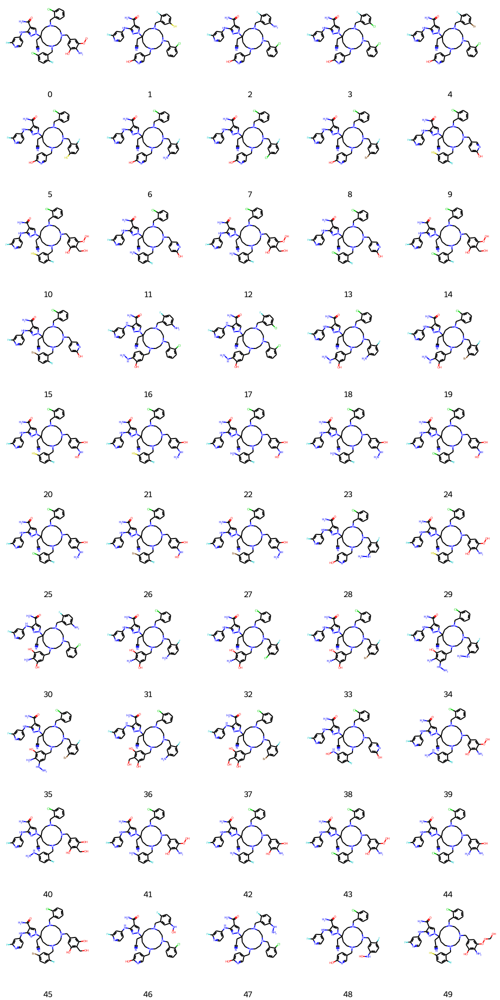

In [189]:
# example with run "maxsim_ap"

# pick from runs list
ad = 'maxsim_ap'
show_grid_mols(ad)

In [190]:
save_mols(ad, [0, 1, 4])

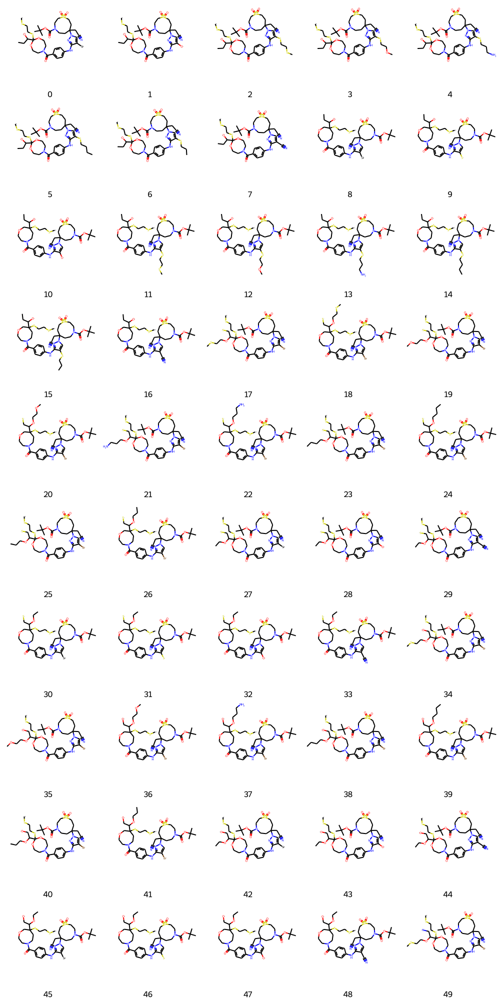

In [191]:
ad = 'filters_validity_ecfp4'
show_grid_mols(ad)

In [192]:
save_mols(ad, [0, 1, 11])

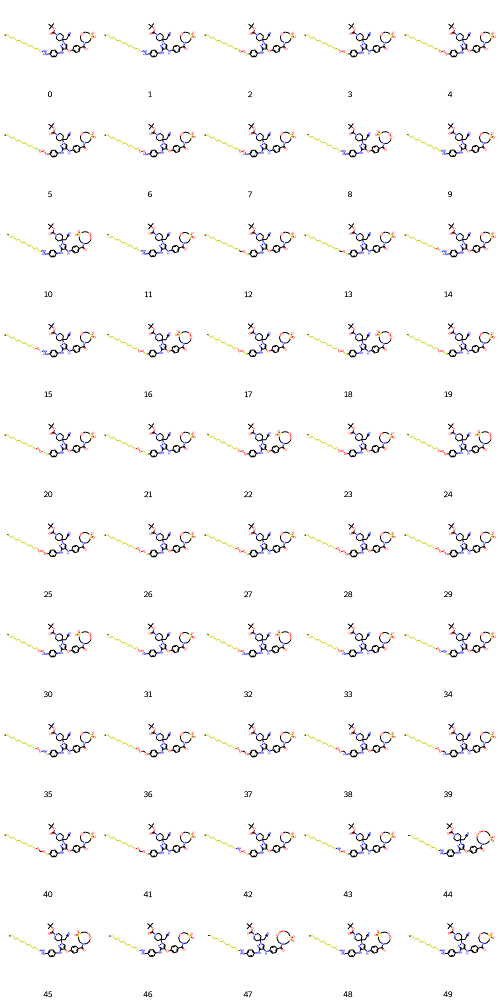

In [193]:
ad = 'smiles_validity_ecfp4'
show_grid_mols(ad)

In [194]:
save_mols(ad, [0, 1, 24])

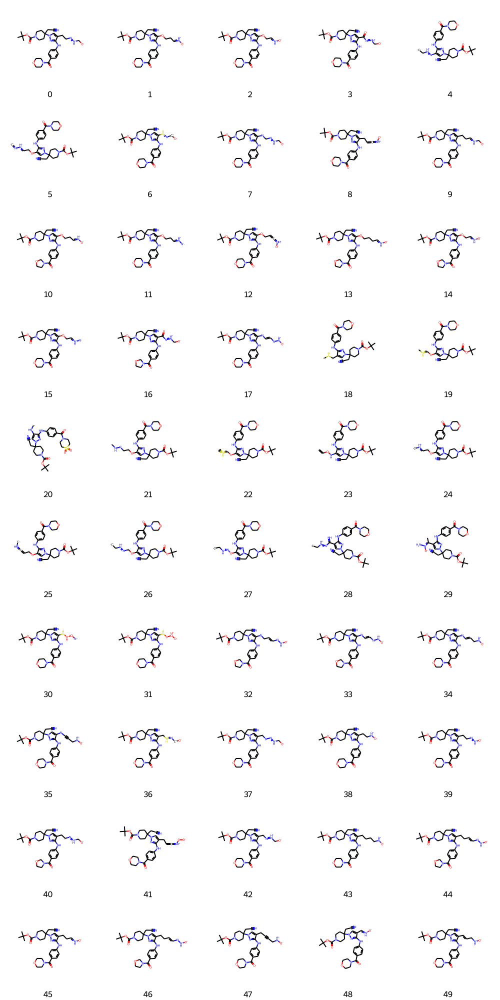

In [195]:
ad = 'range_physchem_maxsim_ap'
show_grid_mols(ad)

In [196]:
save_mols(ad, [4, 5, 49])

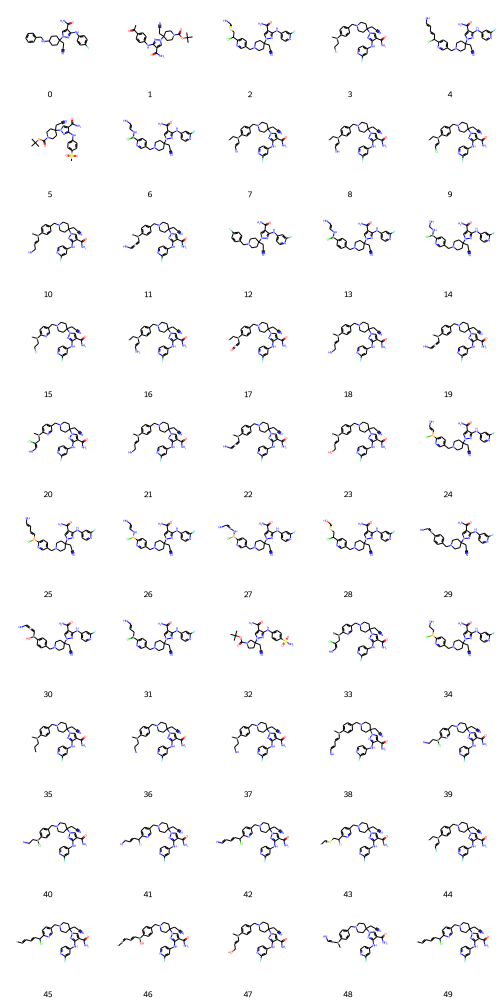

In [197]:
ad = 'range_physchem_range_ap'
show_grid_mols(ad)

In [198]:
save_mols(ad, [4, 20, 44])

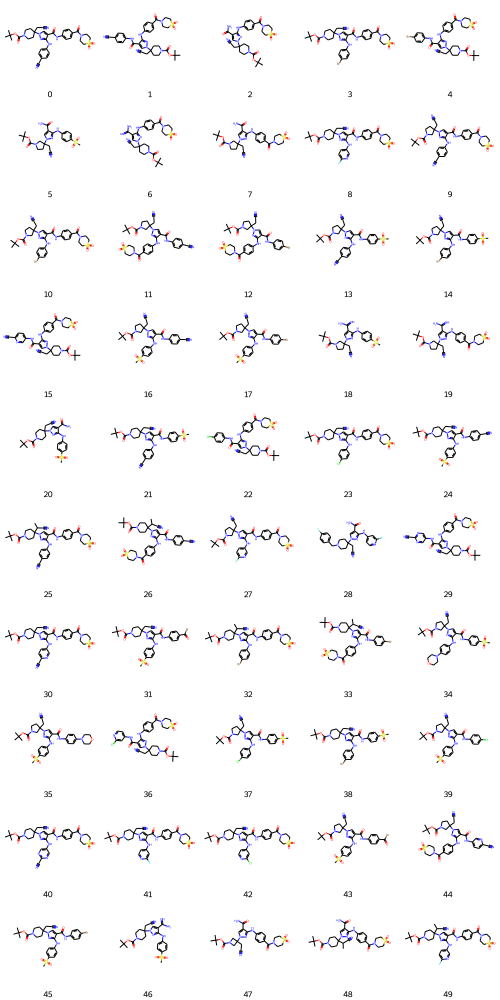

In [199]:
ad = 'range_ecfp4_counts'
show_grid_mols(ad)

In [200]:
save_mols(ad, [0, 8, 49])

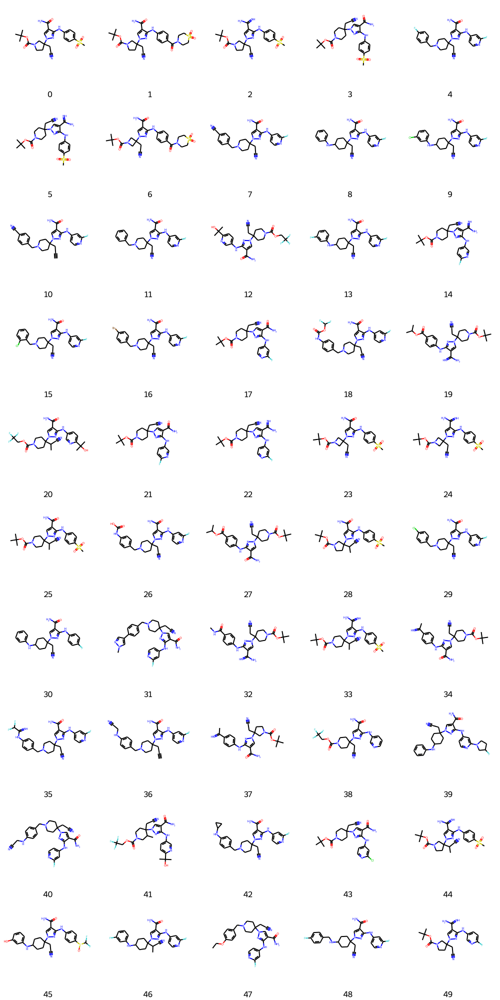

In [201]:
ad = 'range_physchem_range_ecfp4_counts'
show_grid_mols(ad)

In [202]:
save_mols(ad, [5, 6, 40])

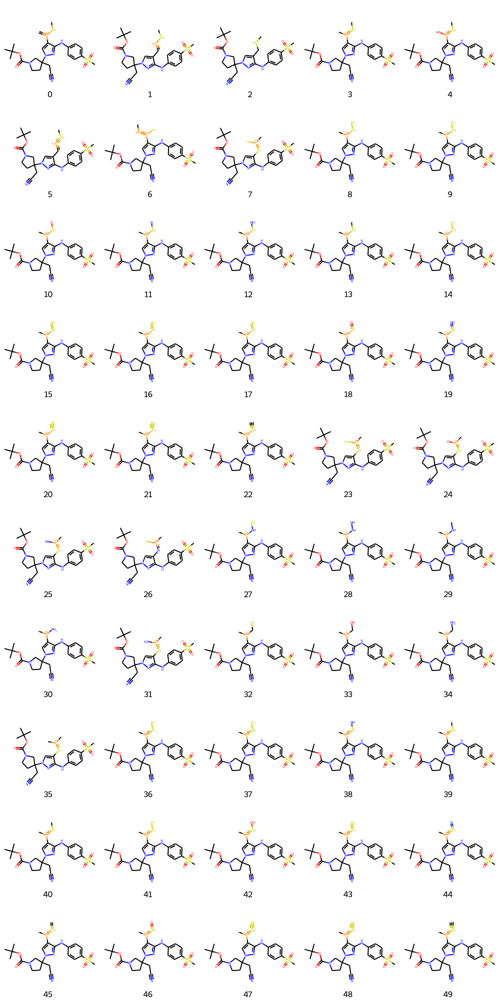

In [203]:
ad = 'range_physchem'
show_grid_mols(ad)

In [204]:
save_mols(ad, [ 6, 8, 25, 29 ])

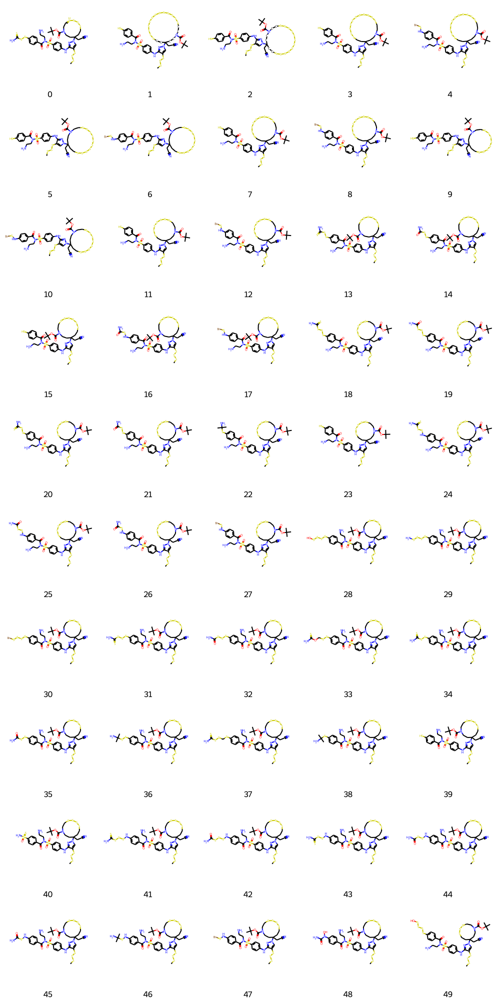

In [205]:
ad = 'maxsim_ecfp4'
show_grid_mols(ad)

In [206]:
save_mols(ad, [ 1, 30, 36 ])

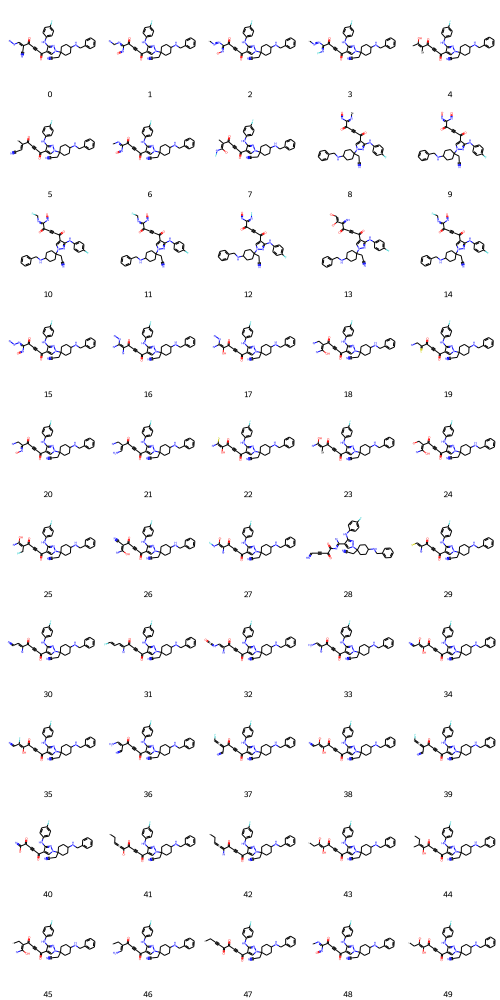

In [207]:
ad = 'range_physchem_maxsim_ecfp4'
show_grid_mols(ad)

In [208]:
save_mols(ad, [ 2, 9, 29 ])

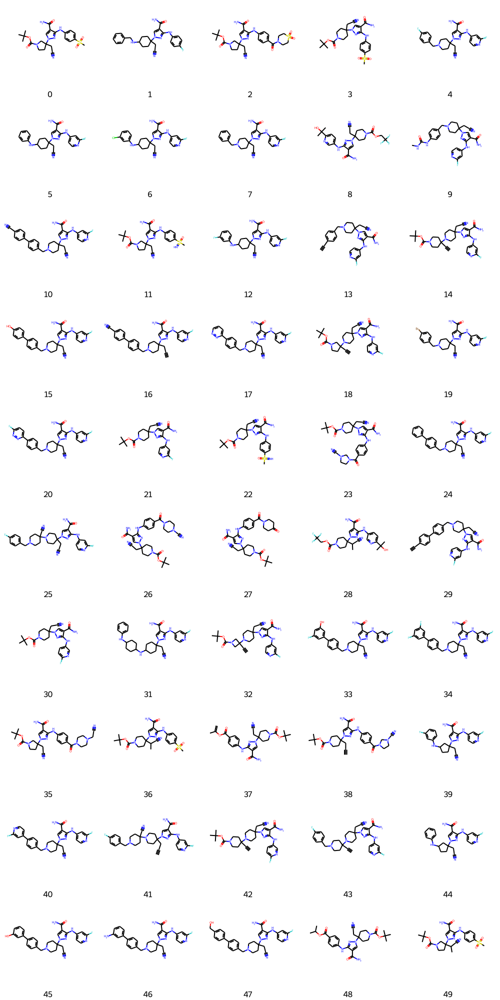

In [209]:
ad = 'range_physchem_range_ecfp6'
show_grid_mols(ad)

In [210]:
save_mols(ad, [ 4, 21, 28 ])

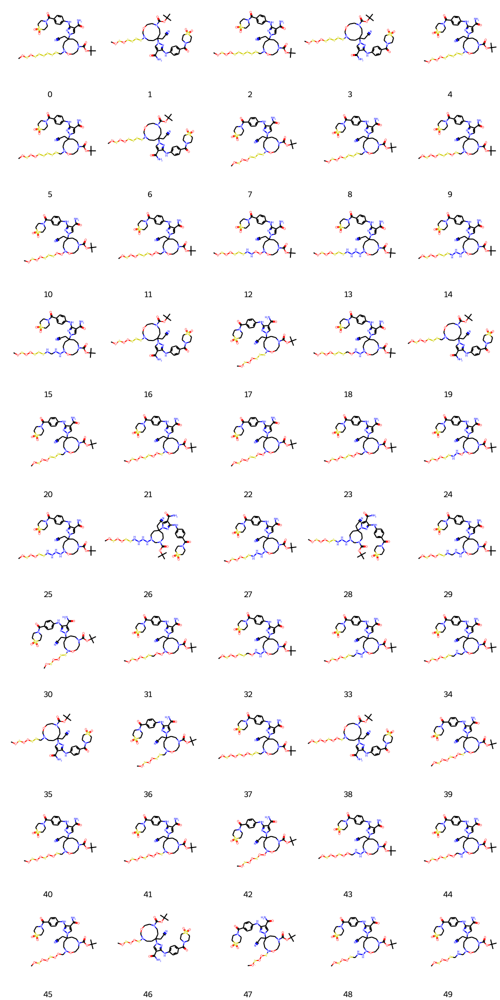

In [211]:
ad = 'maxsim_ecfp6'
show_grid_mols(ad)

In [212]:
save_mols(ad, [ 0, 17, 29 ])

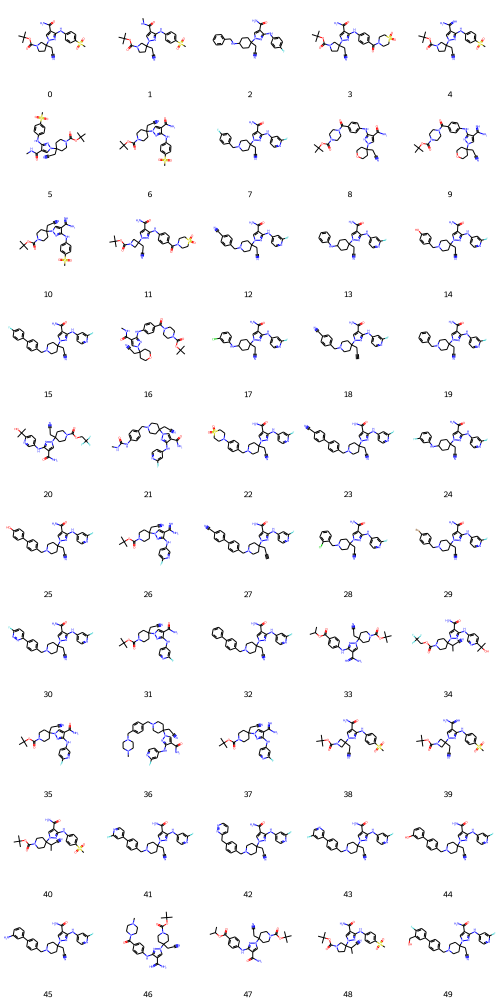

In [213]:
ad = 'range_physchem_range_ecfp4'
show_grid_mols(ad)

In [214]:
save_mols(ad, [ 17, 19, 42 ])

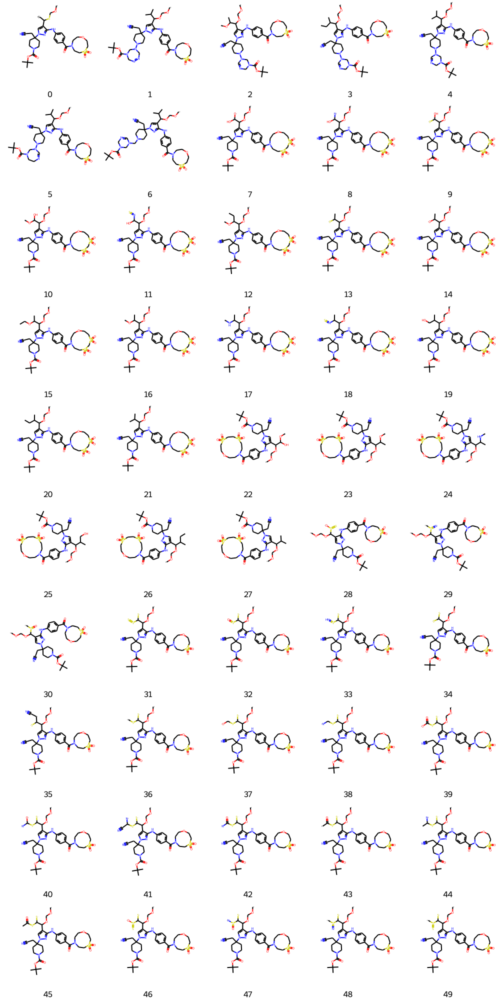

In [215]:
ad = 'range_qed'
show_grid_mols(ad)

In [216]:
save_mols(ad, [ 2, 4, 19 ])

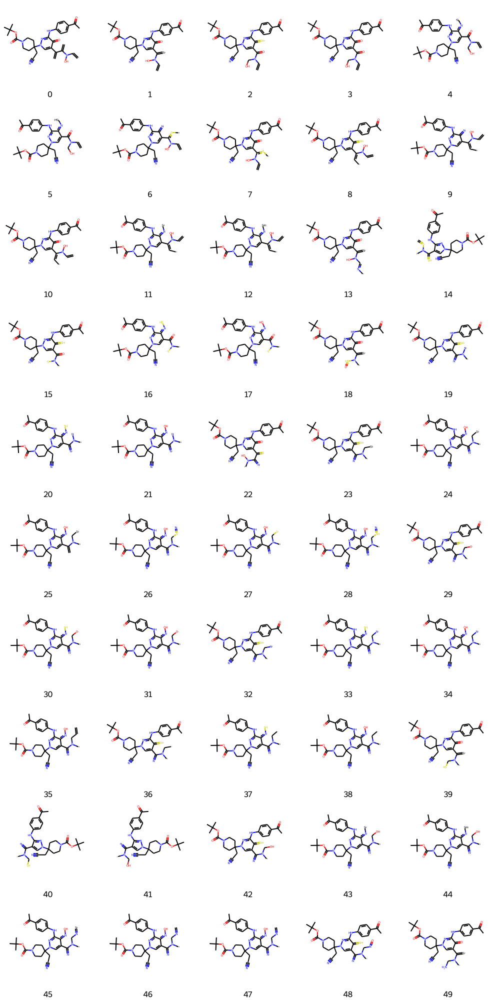

In [217]:
ad = 'range_physchem_maxsim_ecfp6'
show_grid_mols(ad)

In [218]:
save_mols(ad, [ 22, 31, 49 ])

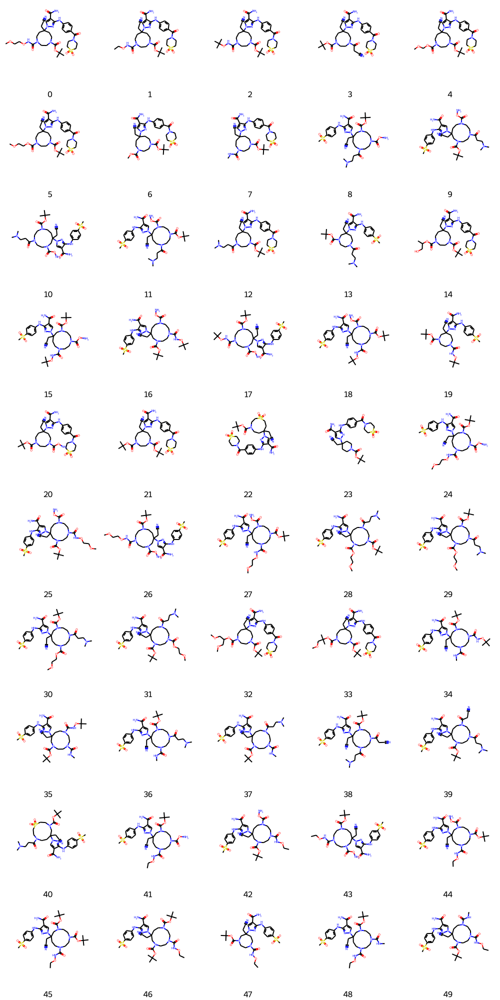

In [219]:
ad = 'range_ecfp4'
show_grid_mols(ad)

In [220]:
save_mols(ad, [ 0, 9, 25 ])

In [223]:
runs

['filters_validity_ecfp4',
 'range_physchem_maxsim_ecfp4',
 'range_qed',
 'maxsim_ecfp6',
 'range_ecfp4_counts',
 'range_physchem_range_ecfp6',
 'smiles_validity_ecfp4',
 'range_physchem_maxsim_ecfp6',
 'range_physchem_range_ecfp4',
 'range_physchem_range_ecfp4_counts',
 'range_physchem',
 'range_physchem_maxsim_ap',
 'range_physchem_range_ap',
 'maxsim_ecfp4',
 'maxsim_ap',
 'range_ecfp4']

In [267]:
ad = 'range_ecfp4'
smiles = smiles_list[runs.index(ad)][4:8]
smiles

['COCOC(=O)N1CCN(C(=O)OC(C)(C)C)CCC(CC#N)(n2cc(C(N)=O)c(Nc3ccc(C(=O)N4CCS(=O)(=O)CC4)cc3)n2)CC1',
 'COCCOC(=O)N1CCN(C(=O)OC(C)(C)C)CCC(CC#N)(n2cc(C(N)=O)c(Nc3ccc(C(=O)N4CCS(=O)(=O)CC4)cc3)n2)CC1',
 'COC(=O)N1CCN(C(=O)OC(C)(C)C)CCC(CC#N)(n2cc(C(N)=O)c(Nc3ccc(C(=O)N4CCS(=O)(=O)CC4)cc3)n2)CC1',
 'CNC(=O)N1CCN(C(=O)OC(C)(C)C)CCC(CC#N)(n2cc(C(N)=O)c(Nc3ccc(C(=O)N4CCS(=O)(=O)CC4)cc3)n2)CC1']

In [272]:
smiles_list[runs.index(ad)][6]

'COC(=O)N1CCN(C(=O)OC(C)(C)C)CCC(CC#N)(n2cc(C(N)=O)c(Nc3ccc(C(=O)N4CCS(=O)(=O)CC4)cc3)n2)CC1'

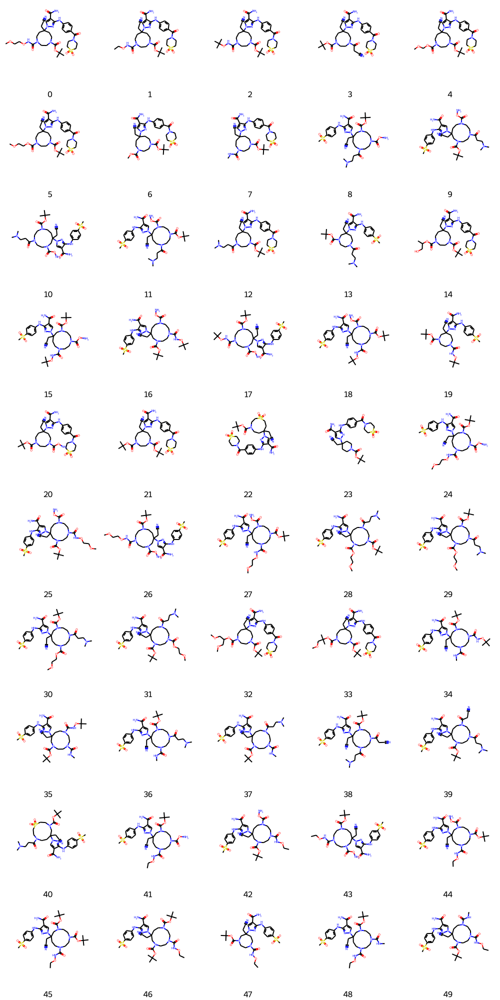

In [268]:
#ad = 'filters_validity_ecfp4'
show_grid_mols(ad)

In [270]:
for i in range(100):
    print(i)
    print(calculateScore(Chem.MolFromSmiles(smiles_list[runs.index(ad)][i])))

0
4.534003734986245
1
4.468853355155495
2
4.558972938669886
3
4.404726412715379
4
4.405058706326065
5
4.373458533408849
6
4.2961199527605185
7
4.331222050662616
8
4.4525622763818795
9
4.4525622763818795
10
4.4525622763818795
11
4.4525622763818795
12
4.380706686319769
13
3.7632814352882393
14
4.715985132924338
15
4.63185411960163
16
4.63185411960163
17
4.63185411960163
18
4.63185411960163
19
3.964819292605914
20
4.410909812900378
21
3.935201548043306
22
4.385480261966771
23
3.3165647507743934
24
4.605506741486786
25
4.605506741486786
26
4.605506741486786
27
4.605506741486786
28
4.425853806487851
29
4.425853806487851
30
4.425853806487851
31
4.425853806487851
32
4.559335236850394
33
4.540806372990891
34
4.556719943777454
35
4.556719943777454
36
4.376339199458802
37
4.376339199458802
38
4.449828407654002
39
4.449828407654002
40
4.4437606085195736
41
4.54356898077029
42
4.54356898077029
43
4.54356898077029
44
4.54356898077029
45
4.4869046883625225
46
4.4869046883625225
47
3.8751402080224837